## Final Project (DATA 620) 
## Topic: Foursquare NYC restaurants
#### Authors: John Mazon, LeTicia Cancel, Bharani Nittala

Video: 

**Data Source:** https://sites.google.com/site/yangdingqi/home/foursquare-dataset

**Assignment:** Location based social networks have attracted millions of users and massively contain their digital footprints. The dataset has crawled a part of these digital footprints from Foursquare in order to study the problems of personalized location recommendation and search. This dataset includes check-in and tip data of restaurant venues in NYC collected from Foursquare from 24 October 2011 to 20 February 2012. It contains 3112 users and 3298 venues with 27149 check-ins and 10377 tips.

checkin_network has two columns. Each line represents a check-in event. The first column is user ID, while the second column is venue ID. 

tips_network has three columns. Each line represents a tip/comment a user left on a venue. The first and second columns are user ID and venue ID, respectively. The third column is tip text. 

All user and venue IDs are anonymized, but they can be matched across the two files. In this dataset, tips may be observed even if a user didn't check-in at a venue, because check-ins are collected in a period of four months while tips are collected without time limitation. 

**Hypothesis** 

Foursquare users explicitly express their interests in venues in two ways, including checking in and leaving tips to venues. We suspect a venue being frequently checked in indicates that the venue is popular in a sense that lots of people visit it and like to announce their visits to their friends. A venue being frequently tipped indicates that people are interested in the venue and would like to share their experience with all other users. It’d be interesting to know whether any community structures also exist, if two venues happen to belong to the same community, it means people often go from one to another, indicating these venues are popular among people with some similarities, possibly in taste, culture, occupation or lifestyle. 

**Preliminary Plan & Concerns** 

The preliminary plan is to explore different networks since we have many data points that can be analyzed for relationships/communities. Once we have useful networks we can then further explore them based on the data such as comparison of communities of users who leave tips or comments.  

In [1]:
#loading libraries
import pandas as pd
import os
import requests
import zipfile
import networkx as nx
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import scipy
from nltk.corpus import stopwords
import itertools
import collections
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
from operator import itemgetter

# Downloading and Extracting Datasets

Two bipartite networks of users and restaurant locations in New York City on Foursquare, from 24 October 2011 to 20 February 2012. In one network, an edge denotes a check-in event of a user at a restaurant. In the other, an edge exists if a user left a tip/comment on a restaurant. Metadata include comments.

In [2]:
checkin_network = pd.read_csv("https://raw.githubusercontent.com/ltcancel/DATA620/main/Final%20Project/dataset_ubicomp2013/dataset_ubicomp2013_checkins.txt", sep="\t", header=None)
tips_network = pd.read_csv("https://raw.githubusercontent.com/ltcancel/DATA620/main/Final%20Project/dataset_ubicomp2013/dataset_ubicomp2013_tips.txt", sep="\t", header=None, encoding='ISO-8859-1')

In [3]:
checkin_network.columns = ['userID', 'venueID']
checkin_network.head()

,userID,venueID
0,35443,899
1,24973,42406
2,14860,177
3,222505,177
4,63524,609


In [4]:
tips_network.columns = ['userID','venueID','tipText']
tips_network.head()

,userID,venueID,tipText
0,24436,15,make your own sandwich: tuna salad on country ...
1,8550,20,The calamari as an appetizer and the quail. Pr...
2,1537,20,Be careful with the napkins on your pants. The...
3,59283,20,"try the steak frites, it's the best - believe me"
4,713,20,go visit google across the street. see the big...


# Creating the Graph

In [5]:
G = nx.Graph()

We convert the tips_network datafram into a list of tuples so it can be added as graph edges later. 

In [6]:
records = tips_network[['userID','venueID']]
records = records.to_records(index=False)
tips_tuple = list(records)
tips_tuple[:10]

[(24436, 15),
 (8550, 20),
 (1537, 20),
 (59283, 20),
 (713, 20),
 (40518, 20),
 (33560, 20),
 (17435, 20),
 (59010, 20),
 (59010, 20)]

We create the graph using the bipartite data and reference the User ID which contains the ID of each individual who checked in and the Venue ID of the resturant they checked into. 

In [7]:
G.add_nodes_from(checkin_network, bipartite='userID')
G.add_nodes_from(checkin_network, bipartite='venueID')

count = 0
for index, edge in tips_network.iterrows():
    source, dest = int(edge["userID"]), int(edge["venueID"])
    
    G.add_edge(source,dest)
    count +=1
    if count == 1500:
        break

We can see that our network as 1171 nodes from the checkin_network and 1383 edges from the tips_network. 

In [8]:
print("Number of nodes in checkin network:", G.number_of_nodes())
print("Number of edges in tips network:", G.number_of_edges())

Number of nodes in checkin network: 1171
Number of edges in tips network: 1383


# Graph Plots

The original plot was very large 

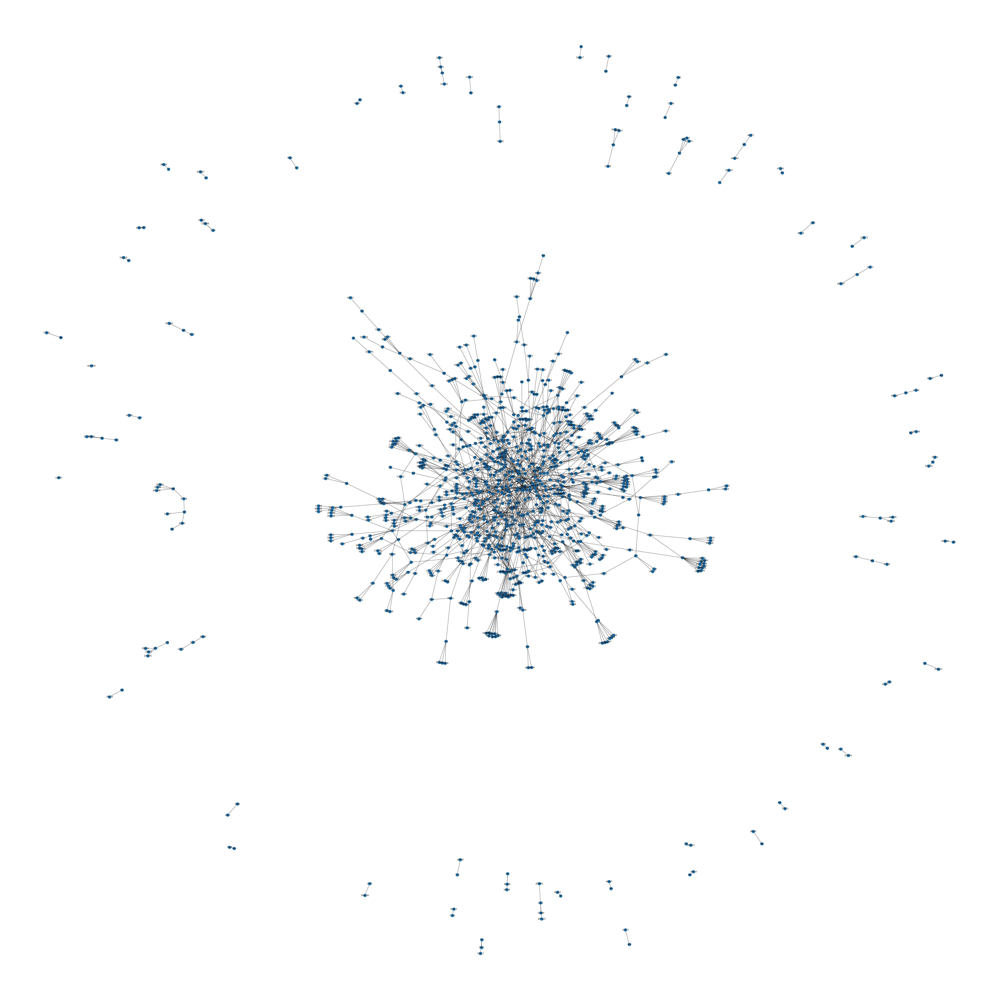

In [9]:
fig = plt.figure(figsize=(80, 80)) 
# nx.draw(checkin_network_graph, with_labels=True)
nx.draw(G, with_labels=True)
# nx.draw(checkin_network_graph, node_size=10)

plt.axis('equal') 
plt.show()

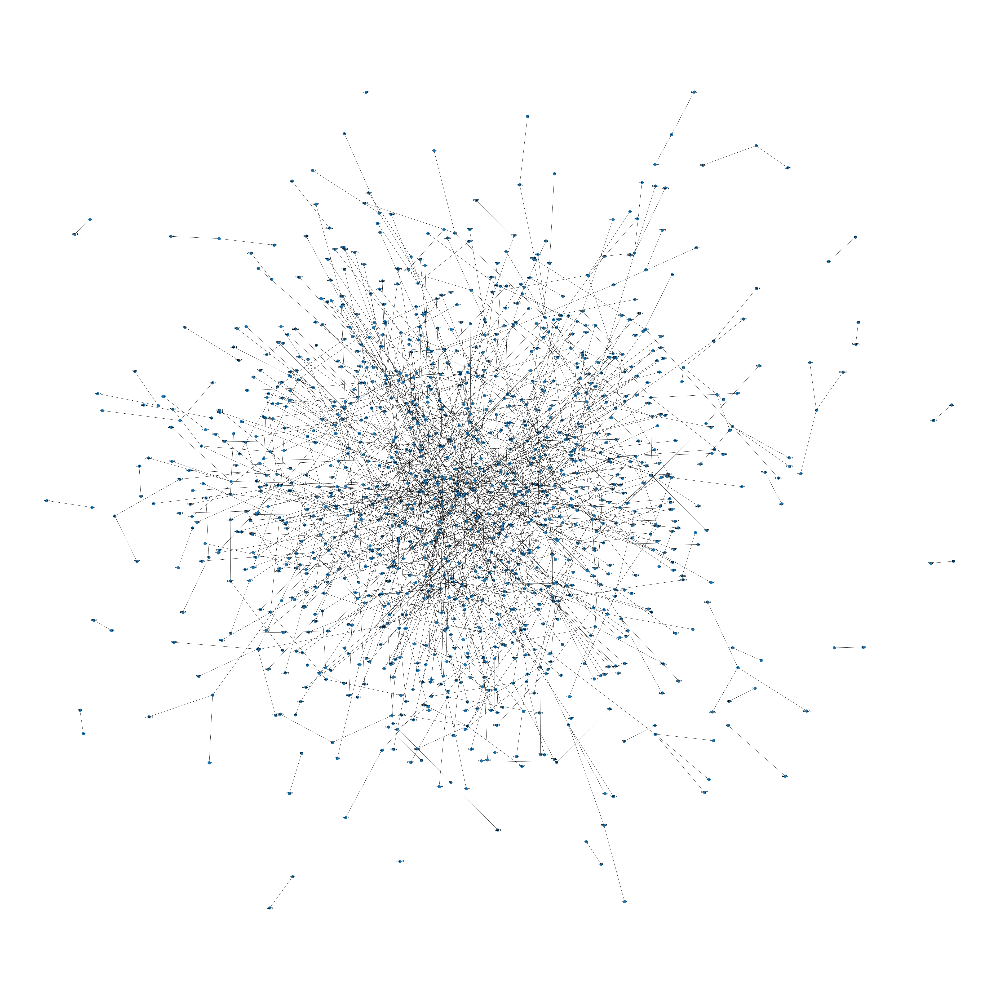

In [10]:
fig = plt.figure(figsize=(80, 80)) 
# nx.draw(checkin_network_graph, with_labels=True)
nx.draw(G, pos=nx.spring_layout(G, iterations=10), with_labels=True)
# nx.draw(checkin_network_graph, node_size=10)

plt.axis('equal') 
plt.show()

In [11]:
G = nx.from_pandas_edgelist(checkin_network, 'userID','venueID')

count = 0

tips_network_graph = nx.Graph()

for index, edge in tips_network.iterrows():
    source, dest = int(edge["userID"]), int(edge["venueID"])
    
    tips_network_graph.add_edge(source, dest)
    count += 1
    if count == 1500:
        break

# Centrality Measures
In graph theory and network analysis, indicators of centrality assign numbers or rankings to nodes within a graph corresponding to their network position. Applications include identifying the most influential person(s) in a social network, key infrastructure nodes in the Internet or urban networks, super-spreaders of disease, and brain networks.Centrality concepts were first developed in social network analysis, and many of the terms used to measure centrality reflect their sociological origin.

In [12]:
nx.info(G)

'Name: \nType: Graph\nNumber of nodes: 4871\nNumber of edges: 13472\nAverage degree:   5.5315'

In [13]:
degree_dict = dict(G.degree(G.nodes()))
nx.set_node_attributes(G, degree_dict, 'degree')

sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
print("Top 5 nodes by degree:")
for d in sorted_degree[:5]:
    print(d)

Top 5 nodes by degree:
(45720, 88)
(4156, 85)
(3184, 64)
(21501, 52)
(25321, 44)


In [14]:
#most_influential
degree_dict = nx.degree_centrality(G)
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
print("Top 5 nodes by degree centrality:")
for d in sorted_degree[:5]:
    print(d)

Top 5 nodes by degree centrality:
(45720, 0.018069815195071868)
(4156, 0.017453798767967144)
(3184, 0.013141683778234086)
(21501, 0.010677618069815195)
(25321, 0.009034907597535934)


In [15]:
#closeness centrality
closeness_dict = nx.closeness_centrality(G)
sorted_closeness = sorted(closeness_dict.items(), key=itemgetter(1), reverse=True)
print("Top 5 nodes by  closeness:")
for d in sorted_closeness[:5]:
    print(d)

Top 5 nodes by  closeness:
(4156, 0.29504830428872675)
(21501, 0.2848778341533086)
(1002, 0.2844573626777015)
(3184, 0.2810229693225376)
(45720, 0.28077731987382915)


In [16]:
#betweeness centrality
betweenness_dict = nx.betweenness_centrality(G)
sorted_betweenness = sorted(betweenness_dict.items(), key=itemgetter(1), reverse=True)
print("Top 5 nodes by betweenness centrality:")
for d in sorted_betweenness[:5]:
    print(d)

Top 5 nodes by betweenness centrality:
(4156, 0.06468060353113629)
(45720, 0.037515018772114)
(3184, 0.03273972916857997)
(21501, 0.028033316450169734)
(476, 0.019350863037523574)


In [17]:
#eigenvector centrality
eigenvector_centrality_dict = nx.eigenvector_centrality(G)
sorted_eigenvector = sorted(eigenvector_centrality_dict.items(), key=itemgetter(1), reverse=True)
print("Top 5 nodes by eigenvector centrality:")
for d in sorted_eigenvector[:5]:
    print(d)

Top 5 nodes by eigenvector centrality:
(4156, 0.23950325539991324)
(45720, 0.2034137696252877)
(21501, 0.16024672260483563)
(3184, 0.13518402845383481)
(1002, 0.10323891423649532)


# Ego Network
Egocentric networks are local networks with one central node, known as the ego. The network is based off the ego and all other nodes directly connected to the ego are called alters. An Ego is the focal point of the network during data collection and analysis and are ‘surrounded’ by alters. Each alter is nominated only by the ego, therefore egocentric networks are often referred to "perceived" or "cognitive" networks. Ego network analysis is used to analyze the ties among individuals for social support, access to resources, dissemination of information, and alters as influential actors.

In [25]:
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

In [26]:
# Representing the two mode network in matrix
A = nx.adjacency_matrix(S[0])
A

<4845x4845 sparse matrix of type '<class 'numpy.intc'>'
	with 26918 stored elements in Compressed Sparse Row format>

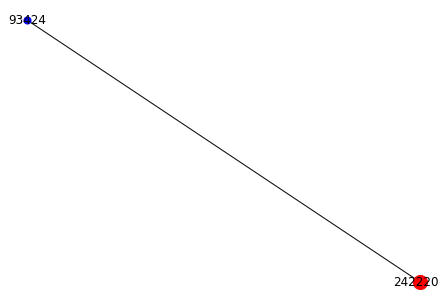

In [24]:
# Ego network
from operator import itemgetter
node_and_degree = S[0].degree()
(largest_hub, degree) = sorted(node_and_degree, key=itemgetter(0))[-1]
hub_ego=nx.ego_graph(S[0],largest_hub)

pos = nx.spring_layout(hub_ego)
nx.draw(hub_ego, pos, node_color="b", node_size=50, with_labels=True)

# Draw ego as large and red
options = {"node_size": 200, "node_color": "r"}
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[largest_hub], **options)
plt.show()

# Sentiment Analysis

In [5]:
# Performing data cleaning on the tips column.This is requried to remove special symbols, convert the text to lower case
# The resulting list still contains all the rows but with treatment done on the text
cult_list=[]

for cult in tips_network.tipText:
    cult=re.sub("[^a-zA-z]"," ",cult) 
    cult=cult.lower()
    cult=word_tokenize(cult)
    lemma=WordNetLemmatizer()
    cult=[lemma.lemmatize(word) for word in cult]
    cult=" ".join(cult)
    cult_list.append(cult)

In [6]:
# Create a list of lists containing lowercase words for each review
words_in_tip = [tip.split() for tip in cult_list]

In [7]:
# List of all words across reviews
all_words = list(itertools.chain(*words_in_tip))

# Create counter
counts = collections.Counter(all_words)

counts.most_common(15)

[('the', 9021),
 ('and', 3908),
 ('a', 3625),
 ('is', 2925),
 ('to', 2159),
 ('of', 2016),
 ('in', 1861),
 ('for', 1853),
 ('it', 1799),
 ('you', 1785),
 ('with', 1506),
 ('i', 1332),
 ('great', 1249),
 ('get', 1210),
 ('best', 1187)]

In [8]:
# Clearly there is a need to remove stop words from the Text
raw_tips = pd.DataFrame(counts.most_common(100),
                             columns=['words', 'count'])

raw_tips.head()

,words,count
0,the,9021
1,and,3908
2,a,3625
3,is,2925
4,to,2159


In [18]:
# Adding additional list of keywords to the stopwords available in the ntlk library
stop_list = nltk.corpus.stopwords.words('english')
newStopWords = ['wa','\\','via','fondu','foodspotting']
stop_list.extend(newStopWords)
filtered_words = []
for w in all_words:
    if w not in stop_list:
        filtered_words.append(w)

In [19]:
# The list looks much better now. Bit of back and forth was performed to add more stop words above.
counts = collections.Counter(filtered_words)

counts.most_common(15)

[('great', 1249),
 ('get', 1210),
 ('best', 1187),
 ('try', 1114),
 ('good', 1010),
 ('food', 869),
 ('place', 707),
 ('go', 632),
 ('amazing', 527),
 ('order', 498),
 ('one', 490),
 ('chicken', 488),
 ('service', 464),
 ('delicious', 444),
 ('coffee', 427)]

In [11]:
# The words look better now, when seen in dataframe 
clean_tips = pd.DataFrame(counts.most_common(100),
                             columns=['words', 'count'])

clean_tips.head()

,words,count
0,great,1249
1,get,1210
2,best,1187
3,try,1114
4,good,1010


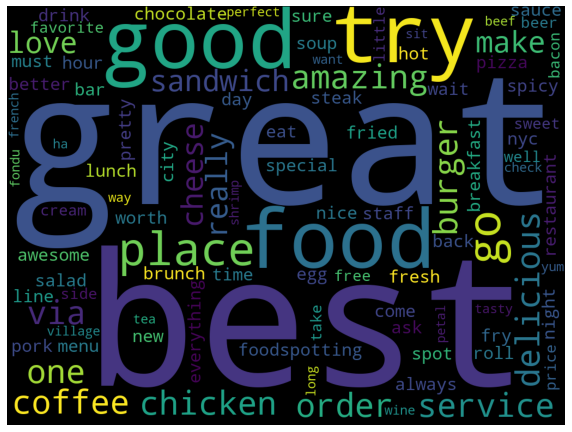

In [12]:
# Visualizing the tips shows that the overall sentiment seems to be more positive with higher number of positive words such 
# as 'awesome', 'great', 'delicious' adjectives used in the tip text

from wordcloud import WordCloud 
import matplotlib.pyplot as plt

plt.subplots(figsize=(10,10))
wordcloud=WordCloud(background_color="black",width=1024,height=768).generate(" ".join(clean_tips.words[0:100]))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [13]:
#We then can calculate the sentiment through the polarity function. polarity ranges from -1 to 1, with -1 being negative and
# being positive. The TextBlob can also use the subjectivity function to calculate subjectivity, which ranges from 0 to 1,
#with 0 being objective and 1 being subjective.
# Subjective sentences generally refer to personal opinion, emotion or judgment whereas objective refers to factual information

df = pd.DataFrame(tips_network.tipText)
df.columns = ['tips']

from textblob import TextBlob
df['polarity'] = df['tips'].apply(lambda x: TextBlob(x).polarity)
df['subjective'] = df['tips'].apply(lambda x: TextBlob(x).subjectivity)

In [36]:
# Quick look into the dataframe shows that the polarity is mostly positive and subjectivity tending towards 1
# Subjectivity tending towards 1 makes sense as these are reviews left by the customers for restaurants
df

,tips,polarity,subjective
0,make your own sandwich: tuna salad on country ...,0.300000,0.500000
1,The calamari as an appetizer and the quail. Pr...,0.550000,0.737500
2,Be careful with the napkins on your pants. The...,-0.250000,0.850000
3,"try the steak frites, it's the best - believe me",1.000000,0.300000
4,go visit google across the street. see the big...,0.000000,0.100000
...,...,...,...
10372,Way too crowded due to the construction at 7th...,0.187500,0.687500
10373,Not for the faint of heart,-0.500000,1.000000
10374,It's goin down Tonight on The Stage (Open Mic ...,-0.077778,0.394444
10375,"In 2011, 60% of the 25,000 orange, red and whi...",0.125000,0.275000


In [37]:
# Looking at the 50%ile value shows that the polarity is positive at 0.225 and subjecticity is higher than 0.5 at 0.525
# This reconciles with the 1-word frequnecy distribution that we observed before
df.median()

polarity      0.225
subjective    0.525
dtype: float64

In [44]:
# Looking at some examples of positive tips

df[df['polarity']>0].head()

,tips,polarity,subjective
0,make your own sandwich: tuna salad on country ...,0.300000,0.5000
1,The calamari as an appetizer and the quail. Pr...,0.550000,0.7375
3,"try the steak frites, it's the best - believe me",1.000000,0.3000
5,Great drinks & good appetizers. Love the desse...,0.666667,0.6500
10,When here you have to order the Mac & Cheese. ...,0.600000,0.9000


In [45]:
# Looking at some examples of less subjective tips. These necessarily do not seem less subjective or more factual

df[df['subjective']<0.1].head()

,tips,polarity,subjective
6,Try the English breakfast,0.0,0.0
8,And by the way if u are looking for a Job on a...,0.0,0.0
9,Go for the grattin dauphinois!,0.0,0.0
11,People watching + Cheesecake + Sex & The City,0.0,0.0
12,para brunchear,0.0,0.0


In [46]:
# Looking at the examples of highly subjective tips shows the phrases with adjectives typically tend to have higher subjectivity

df[df['subjective']>0.7].head()

,tips,polarity,subjective
1,The calamari as an appetizer and the quail. Pr...,0.55000,0.7375
2,Be careful with the napkins on your pants. The...,-0.25000,0.8500
10,When here you have to order the Mac & Cheese. ...,0.60000,0.9000
28,Grilled corn+mojito+beer+garlic shrimp+Cuban s...,1.00000,1.0000
30,"Ask Mike, the bartender, to put some Val Dooni...",0.78125,0.9000


In [31]:
# Apart from 1-word frequency analysis, it makes sense to check bigrams and trigrams if polarity improves with more words
# together. Hypothesis is that, the polarity and subjectivity are more pronounced with 2 or 3 words together

from sklearn.feature_extraction.text import CountVectorizer
c_vec = CountVectorizer(stop_words=stop_list, ngram_range=(2,3))
# matrix of ngrams
ngrams = c_vec.fit_transform(df['tips'])
# count frequency of ngrams
count_values = ngrams.toarray().sum(axis=0)
# list of ngrams
vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram_trigram'})

In [33]:
# Calculating polarity and subjectivity

df_ngram['polarity'] = df_ngram['bigram_trigram'].apply(lambda x: TextBlob(x).polarity)
df_ngram['subjective'] = df_ngram['bigram_trigram'].apply(lambda x: TextBlob(x).subjectivity)

In [34]:
# Quick look into the dataframe shows that the polarity is more positive and subjectivity is tending towards 0 relative to
# one word frequency measured before
df_ngram

,frequency,bigram_trigram,polarity,subjective
0,115,one best,1.000000,0.300000
1,106,village voice,0.000000,0.000000
2,105,make sure,0.500000,0.888889
3,93,happy hour,0.800000,1.000000
4,91,new york,0.136364,0.454545
...,...,...,...,...
119497,1,00 anywhere,0.000000,0.000000
119498,1,00 11 00,0.000000,0.000000
119499,1,00 11,0.000000,0.000000
119500,1,00 10 30am,0.000000,0.000000


In [50]:
# Looks like majority of the bigram and trigram have neutral polarity. From data above, it makes sense as two word frequency
# reveals more of 'places' such as 'New York' or restaurants such as 'Village Voice' which do not necessarily have a sentiment
# attached to the keywords.

df_ngram.median()

frequency     1.0
polarity      0.0
subjective    0.0
dtype: float64

In [28]:
# Attempted to build Topic model using NMF technique
# Non-Negative Matrix Factorization (NMF) is a matrix decomposition method, which decomposes a matrix into the product
#of W and H of non-negative elements. The default method optimizes the distance between the original matrix and WH, i.e., 
#the Frobenius norm

#Source: https://towardsdatascience.com/text-analysis-basics-in-python-443282942ec5

#Results show top 5 topics where 1 topic is positive review (Topic #0 and Topic #4) and second topic is recommendations
# such as Topic #3 and remaining topics seem to be related with online checkins 

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.pipeline import make_pipeline
tfidf_vectorizer = TfidfVectorizer(stop_words=stop_list, ngram_range=(2,3))
nmf = NMF(n_components=5)
pipe = make_pipeline(tfidf_vectorizer, nmf)
pipe.fit(df['tips'])
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()
print_top_words(nmf, tfidf_vectorizer.get_feature_names(), n_top_words=5)

C:\Users\nittalab\Anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


Topic #0: say thank vote, thank vote, say thank, loving prayers, combo answer sushi
Topic #1: restaurants http ow, fest full list, full list restaurants, full list, food fest full
Topic #2: app online, order app online, order app, straight register, app online beat
Topic #3: try apple, apple crumble, try apple crumble, crumble vanilla, crumble vanilla custard
Topic #4: better service, big big, big smile, smile always better, smile always



In [29]:
# Attempted to build Topic model using LDA as well 
# Latent Dirichlet Allocation is a generative probabilistic model for collections of discrete dataset such as text corpora.
# It is also a topic model that is used for discovering abstract topics from a collection of documents.

# Aim is to learn more about the topics and discover anything new not observed through LDA technique
# Nothing was surprising but Coffee and sea food individually came out as topics which show popularity for these items


from sklearn.decomposition import LatentDirichletAllocation
tfidf_vectorizer = TfidfVectorizer(stop_words=stop_list, ngram_range=(2,3))
lda = LatentDirichletAllocation(n_components=5)
pipe = make_pipeline(tfidf_vectorizer, lda)
pipe.fit(df['tips'])
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()
print_top_words(lda, tfidf_vectorizer.get_feature_names(), n_top_words=5)

Topic #0: say thank, thank vote, say thank vote, free wifi, one best
Topic #1: best coffee, better service, great food, one best, always better
Topic #2: village voice, love place, new york, really good, mac cheese
Topic #3: village voice, http ow, http ow ly, ow ly, food fest
Topic #4: fish tacos, really good, soup dumplings, order app, lunch special



In [24]:
# Let's filter to the one node (user_id) which has highest degree of centrality and check if the polarity from this node 
# is different from median of the network. For this reason, I have selected the node 45720 

tips_network_45720 = tips_network[tips_network.userID == 45720]


df1 = pd.DataFrame(tips_network_45720.tipText)
df1.columns = ['tips']

df1['polarity'] = df1['tips'].apply(lambda x: TextBlob(x).polarity)
df1['subjective'] = df1['tips'].apply(lambda x: TextBlob(x).subjectivity)

In [25]:
# The user with highest degree of centrality actually contributed to the positive polarity compared to network average
df1.median()

polarity      0.433333
subjective    0.702083
dtype: float64

In [32]:
# It touches upon the topics identified in the topic modeling, especially sea food related 
df1

,tips,polarity,subjective
2393,"The Duck, Pork, and Chicken Congee is so amazi...",-0.046875,0.587500
2852,They make a fantastic Tonkatsu Ramen that has ...,0.583333,0.816667
6220,Try the Schaw soup! Really bright flavors and ...,0.450000,0.550000
9592,The Tuna Melt was amazing. Huge and served on ...,0.416667,0.883333


# Conclusion

All in all, in our project we were able to start with tips network and apply different concepts that we learnt during the course such as plotting graphs to visually look at nodes and edges and then measure degree of centrality for each of the nodes. Post that we performed sentiment analysis to measure polarity of the tip texts and got to know about the top topics included in the text. 

We further observed that the User Id that contributed to highest degree of centrality actually contributed positively to the polarity of the network as the user's median value is higher than network's median value for polarity. From topic modeling, it can be concluded that the topics such as Coffee and sea food lead to positive tip reviews as is evident from the User Id with highest degree of centrality. 

# Citation

D. Yang, et al. "Fine-grained preference-aware location search leveraging crowdsourced digital footprints from LBSNs." Proceedings of the 2013 ACM international joint conference on Pervasive and ubiquitous computing. ACM. (2013).